### Zadania

Celem zadań jest napisanie (fragmentów) programów, które wyodrębnią obiekty znajdujące się na podanych obrazach. Rozumie się przez to doprowadzenie obrazów do postaci binarnej z wyraźną separacją między obiektami a tłem oraz poszczególnymi obiektami.

Samo osiągnięcie "jakiegoś" wyniku ([`cv2.threshold`](https://docs.opencv.org/3.4/d7/d1b/group__imgproc__misc.html#gae8a4a146d1ca78c626a53577199e9c57) odpalone, próg wybrany "z palca", _coś tam_ widać, wynik wyświetlony) to co najwyżej połowa sukcesu (i oceny). Ważne jest pokazanie w drodze eksperymentu odpowiedzi na pytania - czy te podane w treści zadania, czy takie, które się Tobie nasunęły.

In [2]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [55]:
# helper functions
def flood_fill(img: np.ndarray) -> np.ndarray:
    im_floodfill = img.copy()
    h, w = img.shape[:2]
    mask = np.zeros((h + 2, w + 2), np.uint8)
    cv2.floodFill(im_floodfill, mask, (0, 0), 255)
    im_floodfill_inv = cv2.bitwise_not(im_floodfill)
    im_out = img | im_floodfill_inv
    return im_out

##### Zad. 1: Monety szare

Dane są dwa czarno-białe obrazy monet, `monety_szare` oraz `monety_szare_szum`, z których drugi zawiera pewien poziom zakłóceń. Dokonaj binaryzacji tych obrazów za pomocą progowania.  
W jaki sposób ustalisz wartość progu? Jak wartość progu wpływa na wyniki?  
Jaki wpływ mają zakłócenia w drugim obrazie? Jak się ich pozbędziesz?

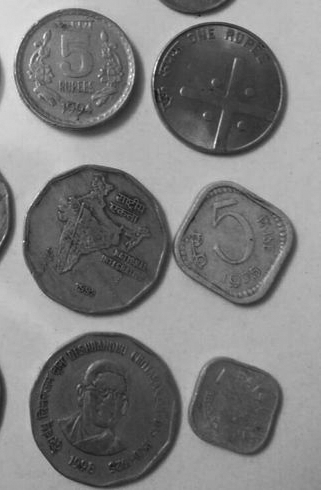

In [3]:
# 1A
monety_szare = cv2.imread("Monety_szare.bmp")
Image.fromarray(cv2.cvtColor(monety_szare, cv2.COLOR_BGR2RGB))

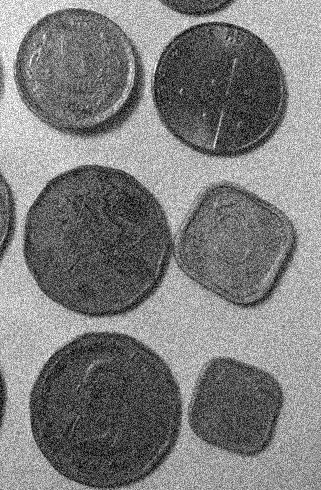

In [4]:
# 1B
monety_szare_szum = cv2.imread("Monety_szare_szum.bmp")
Image.fromarray(cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2RGB))

Rozwiązanie części 1A:

(490, 321, 3)

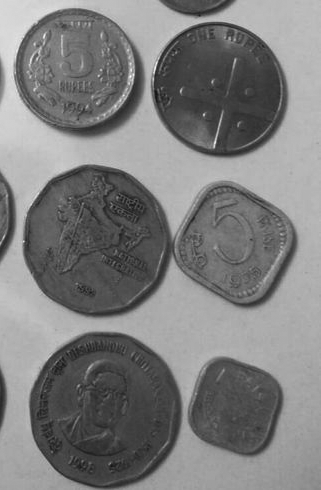

(157290,)

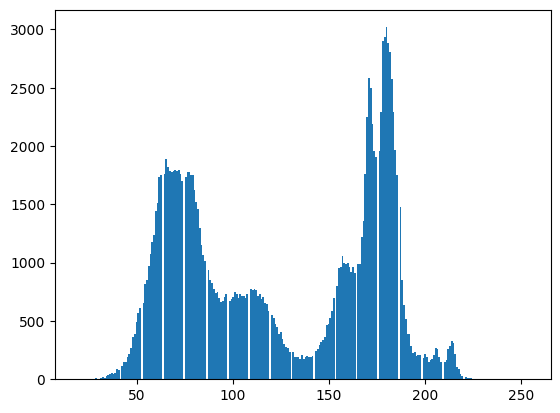

In [38]:
display(monety_szare.shape)
coin_gray_r = monety_szare[:, :, 0]

display(Image.fromarray(b))

display(coin_gray_r.flatten().shape)
_ = plt.hist(coin_gray_r.flatten(), bins=256)

thresholding with 80


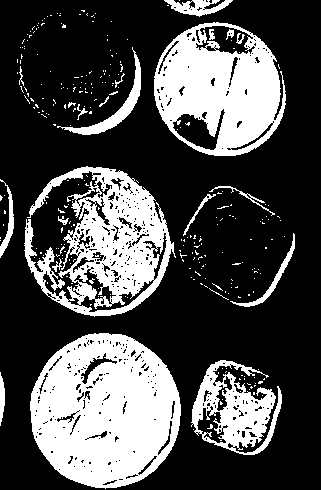

thresholding with 160


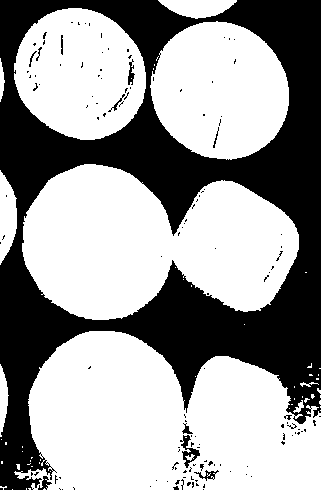

In [39]:
# simple thresholding
(T, img_threshInv) = cv2.threshold(coin_gray_r, 80, 255, cv2.THRESH_BINARY_INV)
print("thresholding with 80")
display(Image.fromarray(img_threshInv))

(T, img_threshInv) = cv2.threshold(coin_gray_r, 160, 255, cv2.THRESH_BINARY_INV)
Image.fromarray(img_threshInv)
print("thresholding with 160")
display(Image.fromarray(img_threshInv))

Edge-based segmentation

blurred image


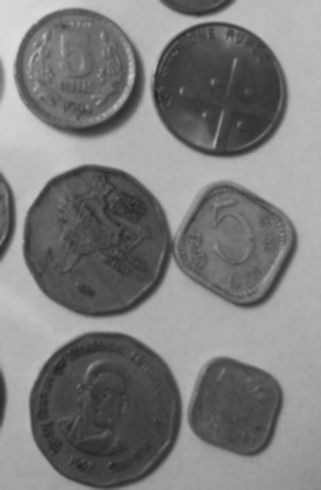

edges with Canny


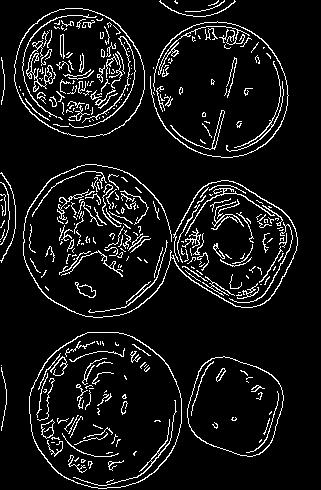

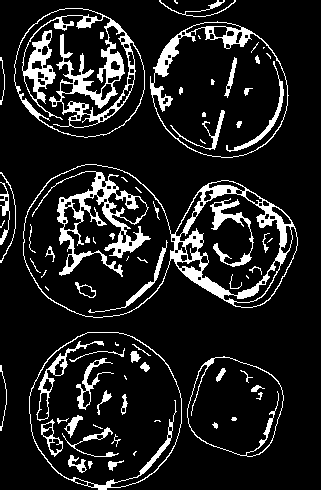

flood fill


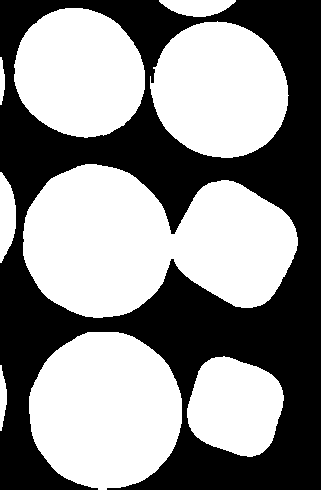

In [54]:
# blur image
img_blur = cv2.GaussianBlur(coin_gray_r, (5, 5), 0)
print("blurred image")
display(Image.fromarray(img_blur))

# detect edges with Canny
edges = cv2.Canny(image=img_blur, threshold1=40, threshold2=60)
print("edges with Canny")
display(Image.fromarray(edges))

# Perform morphological operations to close small gaps
kernel = np.ones((3, 3), np.uint8)
edges_dilated = cv2.dilate(edges, kernel, iterations=1)
edges_closed = cv2.erode(edges_dilated, kernel, iterations=1)

display(Image.fromarray(edges_closed))

# flood fill edges
coin_gray_res = flood_fill(edges_closed)

print("flood fill")
display(Image.fromarray(coin_gray_res))

Rozwiązanie części 1B:


original


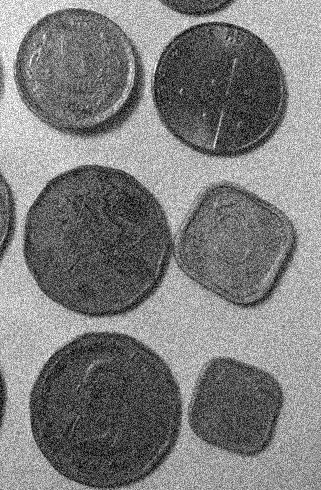

denoised


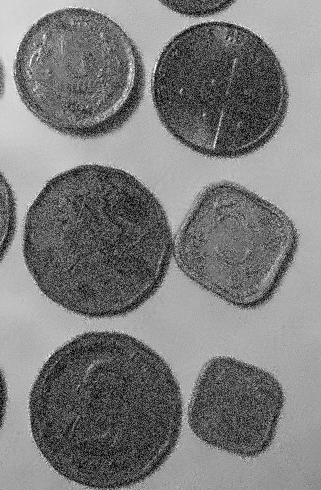

blurred


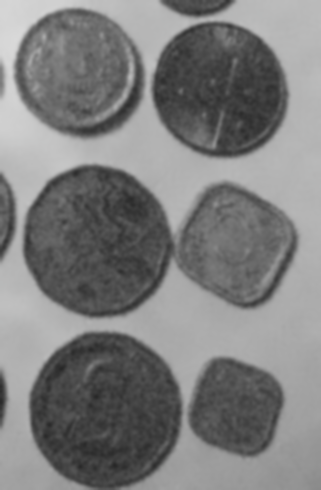

edges


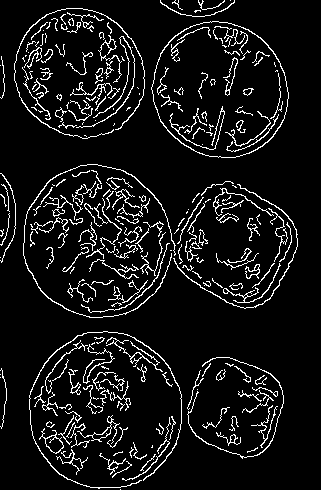

closed edges


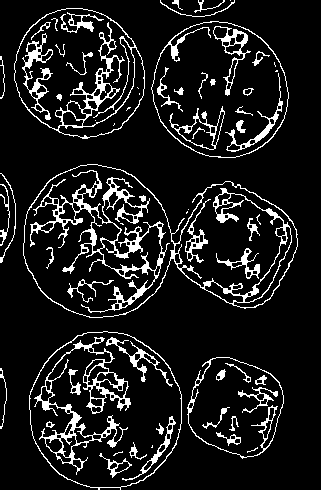

flood fill


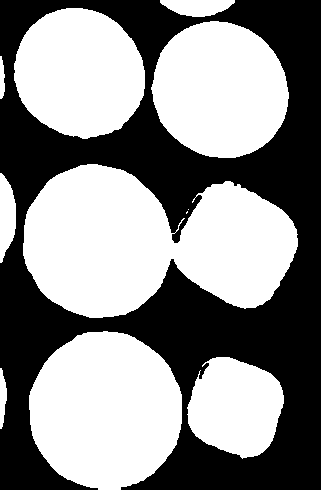

In [60]:
# fast nl denoising
img2_denoise = cv2.fastNlMeansDenoisingColored(monety_szare_szum, None, 10, 10, 7, 21)

# blur
img2_blur = cv2.GaussianBlur(img2_denoise, (9, 9), 0)

# edges with Canny
edges2 = cv2.Canny(image=img2_blur, threshold1=20, threshold2=60)

# close small gaps
kernel = np.ones((3, 3), np.uint8)
edges2_dilated = cv2.dilate(edges2, kernel, iterations=1)
edges2_closed = cv2.erode(edges2_dilated, kernel, iterations=1)

# flood fill edges
img2_out = flood_fill(edges2_closed)

print("original")
display(Image.fromarray(monety_szare_szum))
print("denoised")
display(Image.fromarray(img2_denoise))
print("blurred")
display(Image.fromarray(img2_blur))
print("edges")
display(Image.fromarray(edges2))
print("closed edges")
display(Image.fromarray(edges2_closed))
print("flood fill")
display(Image.fromarray(img2_out))

##### Zad. 2: Monety kolorowe

Na podobnej zasadzie dokonaj binaryzacji poniższych obrazów kolorowych. Skorzystaj z modelu barw HSV. Uzasadnij dobór progu w oparciu o histogram wybranej składowej.

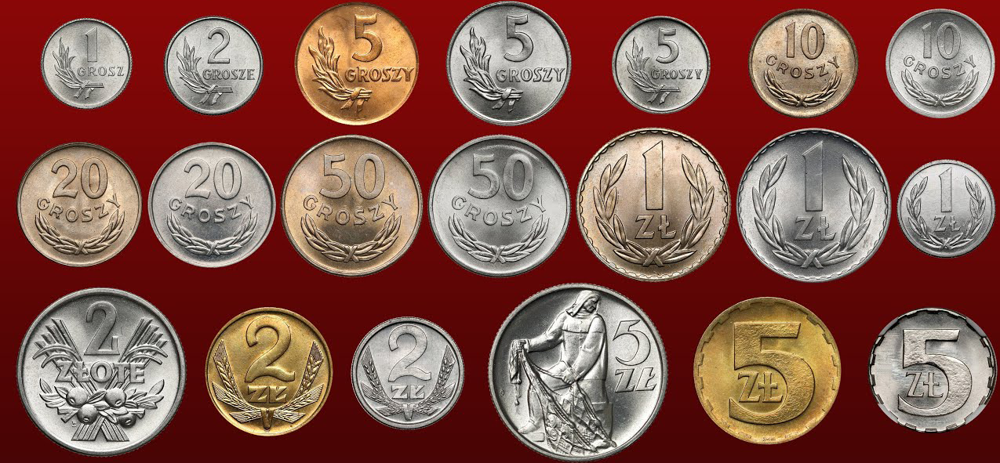

In [9]:
# 2A
monety_kolor = cv2.imread("Monety_kolor.bmp")
Image.fromarray(cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2RGB))

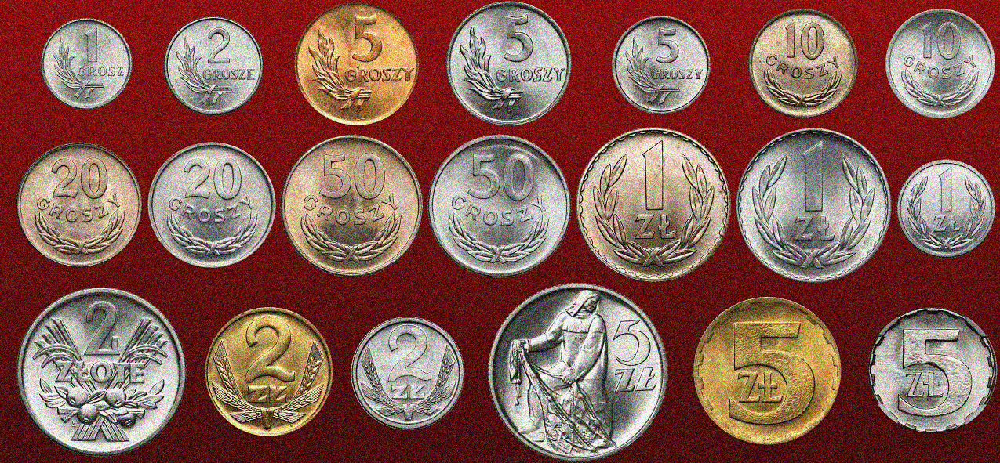

In [10]:
# 2B
monety_kolor_szum = cv2.imread("Monety_kolor_szum.bmp")
Image.fromarray(cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2RGB))

Rozwiązanie części 2A:

hue attribute


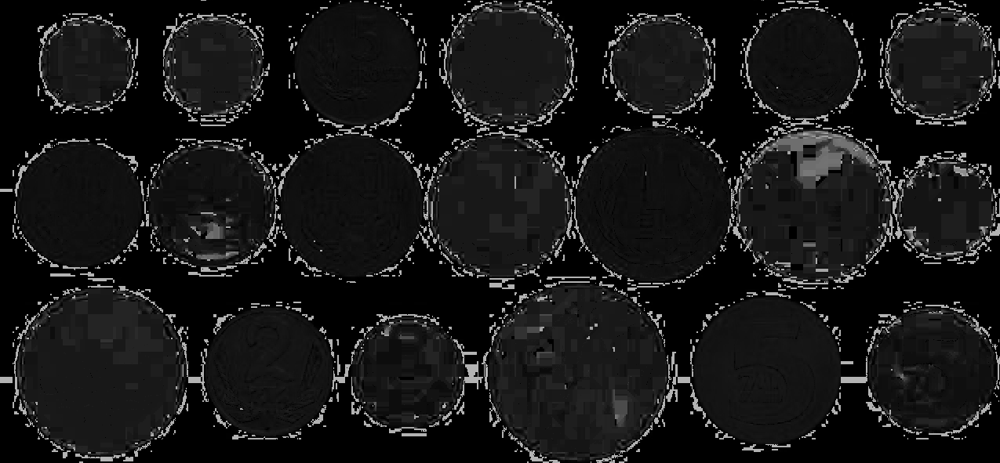

saturation attribute


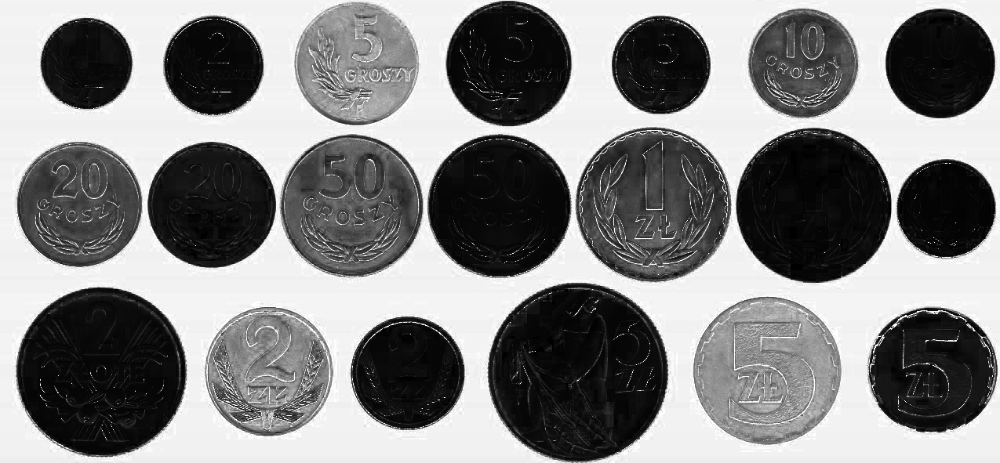

value attribute


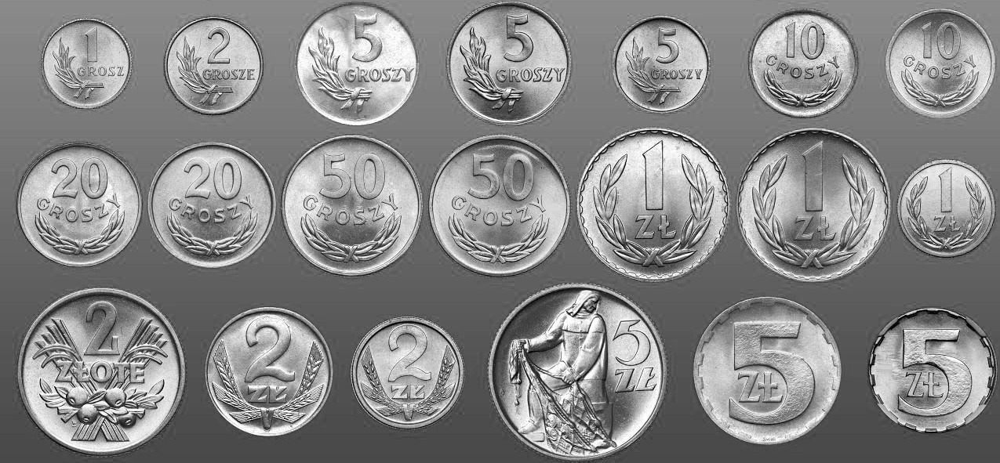

hsv attributes histogram


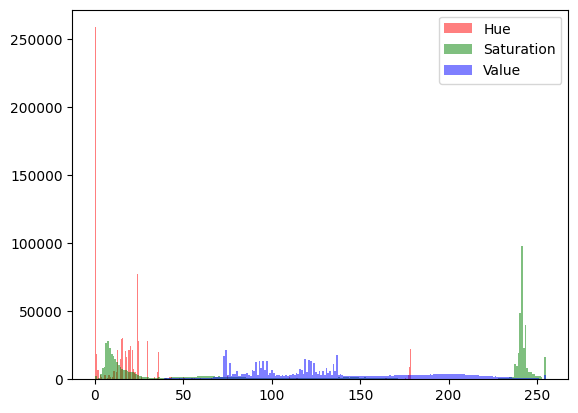

In [61]:
monety_kolor_hsv = cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(monety_kolor_hsv)
# plot value histogram

print("hue attribute")
display(Image.fromarray(h))
print("saturation attribute")
display(Image.fromarray(s))
print("value attribute")
display(Image.fromarray(v))

print("hsv attributes histogram")
_ = plt.hist(h.flatten(), bins=256, color="r", alpha=0.5, label="Hue")
_ = plt.hist(s.flatten(), bins=256, color="g", alpha=0.5, label="Saturation")
_ = plt.hist(v.flatten(), bins=256, color="b", alpha=0.5, label="Value")
plt.legend()
plt.show()

threashold and flood fill


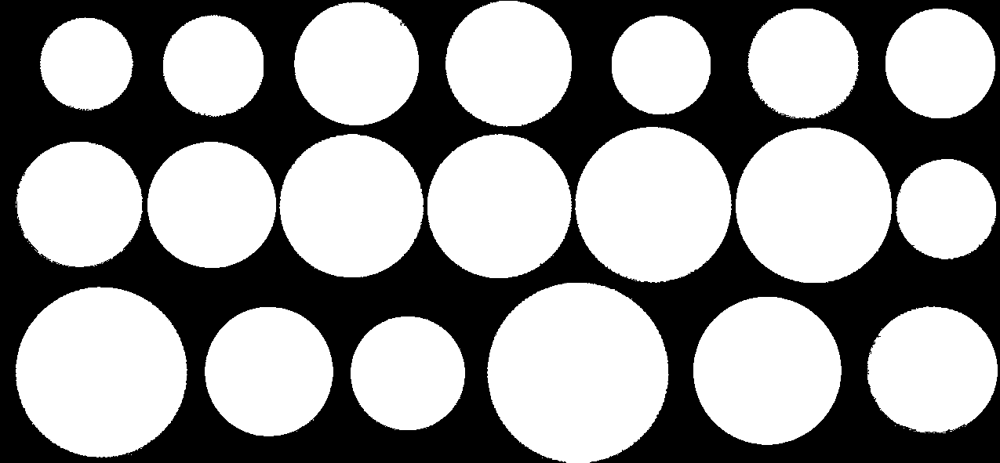

In [63]:
# blur
img3_blur = cv2.GaussianBlur(monety_kolor_hsv, (9, 9), 0)

# threshold
(T, img3_threshInv) = cv2.threshold(s, 200, 255, cv2.THRESH_BINARY_INV)

# flood fill
im3_out = flood_fill(img3_threshInv)

print("threshold and flood fill")
display(Image.fromarray(im3_out))

Rozwiązanie części 2B:


saturation image


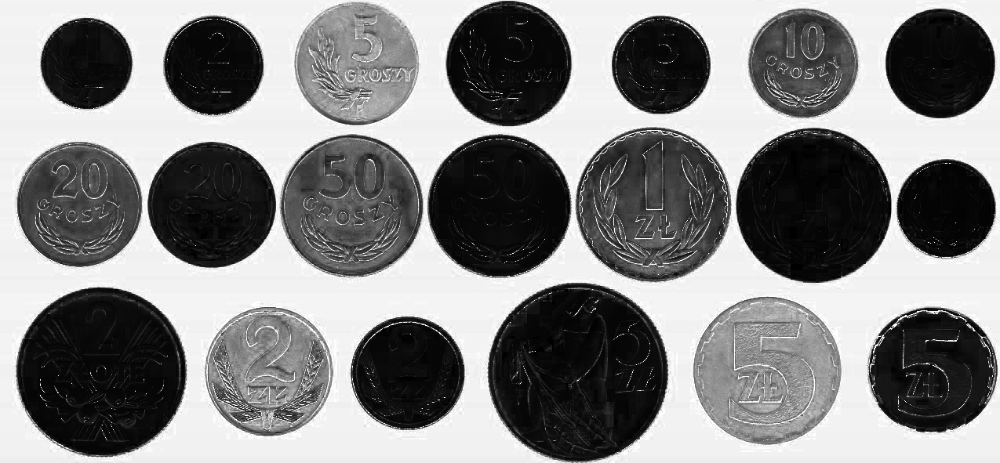

hsv attributes histogram


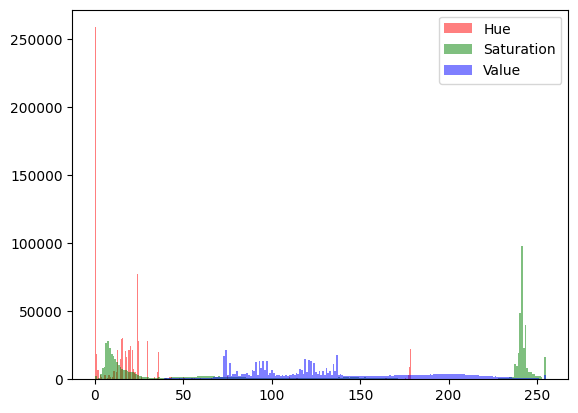

In [30]:
monety_kolor_szum_hsv = cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2HSV)
h2, s2, v2 = cv2.split(monety_kolor_hsv)
# plot value histogram

print("saturation image")
display(Image.fromarray(s2))

print("hsv attributes histogram")
_ = plt.hist(h2.flatten(), bins=256, color="r", alpha=0.5, label="Hue")
_ = plt.hist(s2.flatten(), bins=256, color="g", alpha=0.5, label="Saturation")
_ = plt.hist(v2.flatten(), bins=256, color="b", alpha=0.5, label="Value")
plt.legend()
plt.show()

after threashold and flood fill


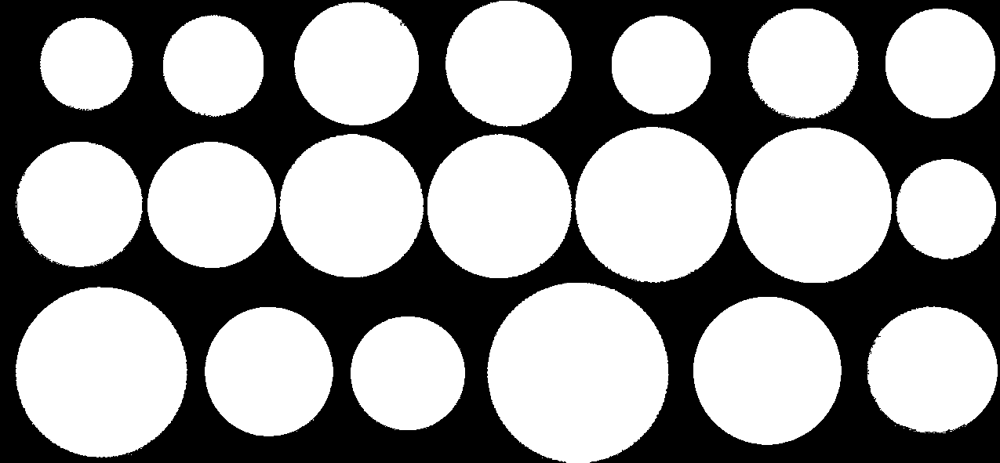

In [31]:
# blur
img4_blur = cv2.GaussianBlur(monety_kolor_szum_hsv, (9, 9), 0)

# simple thresholding
(T, img4_threshInv) = cv2.threshold(s2, 200, 255, cv2.THRESH_BINARY_INV)

# flood fill
im4_floodfill = img4_threshInv.copy()
h4, w4 = img4_threshInv.shape[:2]
mask3 = np.zeros((h4 + 2, w4 + 2), np.uint8)
cv2.floodFill(im4_floodfill, mask3, (0, 0), 255)
im4_floodfill_inv = cv2.bitwise_not(im4_floodfill)
im4_out = img4_threshInv | im4_floodfill_inv

print("after threashold and flood fill")
display(Image.fromarray(im4_out))

##### Zad. 3: Tekst

W tym przypadku należy wyodrębnić litery od bardzo nierównomiernie oświetlonego tła. Skorzystaj z binaryzacji metodą Otsu. Zastosuj binaryzację w sposób lokalny (oknem przesuwnym). Jaki wpływ ma rozmiar okna na jakość binaryzacji? Jak przesuwać okno?

_(Pełna punktacja za zadanie wymaga własnoręcznej implementacji okna przesuwnego i filtracji wewnątrz niego. Użycie zamiast tego_ `cv2.adaptiveThreshold` _liczone jako pół zadania, przy założeniu zrozumienia tej metody.)_

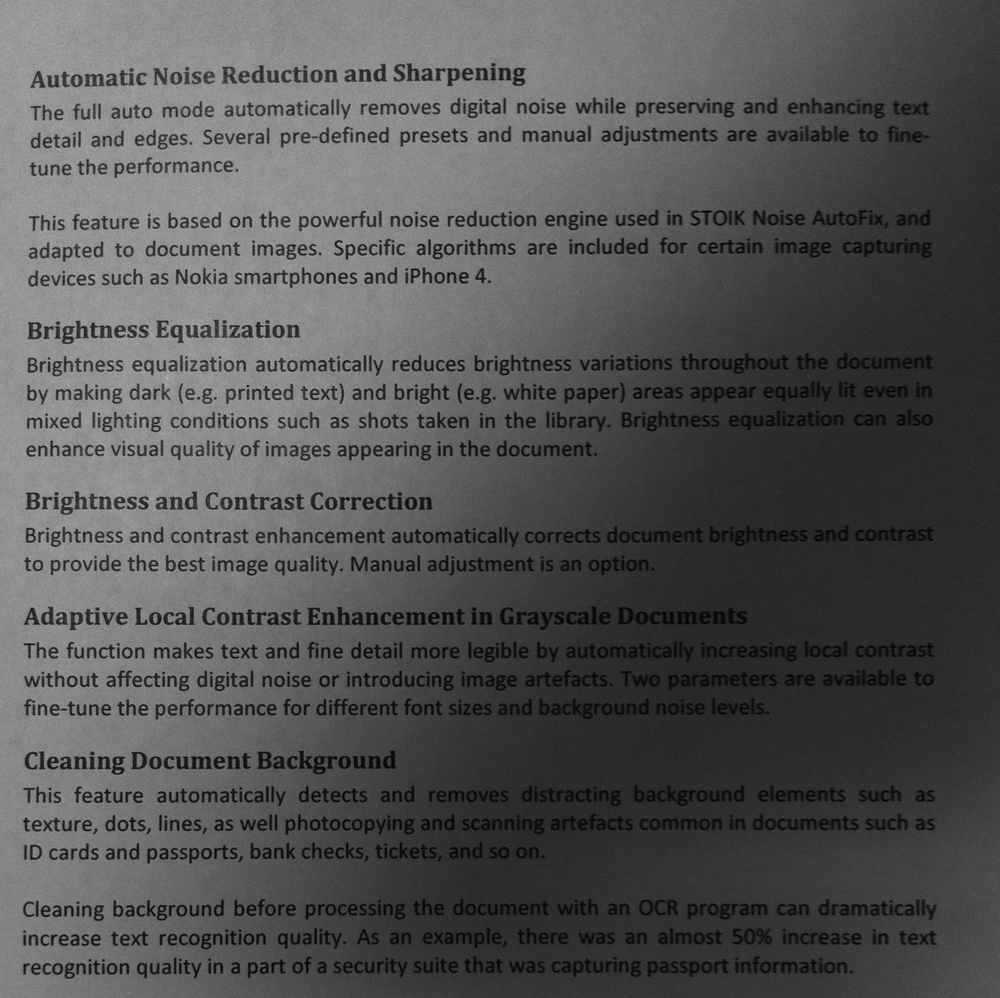

In [6]:
tekst = cv2.imread("Tekst1.bmp")
Image.fromarray(cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY))

Rozwiązanie: